In [2]:
# Import modules
import hvplot.pandas
import pandas as pd
import numpy as np
import requests
from pprint import pprint


In [3]:
# Read csv file
csvfile = pd.read_csv('Resources/Airbnb_Open_Data.csv')
csvfile

/var/folders/24/q7mj2hmn47n21n9t4by4cfpc0000gn/T/ipykernel_1768/4259134527.py:2: DtypeWarning: Columns (25) have mixed types. Specify dtype option on import or set low_memory=False.
  csvfile = pd.read_csv('Resources/Airbnb_Open_Data.csv')


,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,United States,...,$193,10.0,9.0,10/19/2021,0.21,4.0,6.0,286.0,Clean up and treat the home the way you'd like...,NaN
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,United States,...,$28,30.0,45.0,5/21/2022,0.38,4.0,2.0,228.0,Pet friendly but please confirm with me if the...,NaN
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,NaN,Elise,Manhattan,Harlem,40.80902,-73.94190,United States,...,$124,3.0,0.0,NaN,NaN,5.0,1.0,352.0,"I encourage you to use my kitchen, cooking and...",NaN
3,1002755,NaN,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.68514,-73.95976,United States,...,$74,30.0,270.0,7/5/2019,4.64,4.0,1.0,322.0,NaN,NaN
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.79851,-73.94399,United States,...,$41,10.0,9.0,11/19/2018,0.10,3.0,1.0,289.0,"Please no smoking in the house, porch or on th...",NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102594,6092437,Spare room in Williamsburg,12312296767,verified,Krik,Brooklyn,Williamsburg,40.70862,-73.94651,United States,...,$169,1.0,0.0,NaN,NaN,3.0,1.0,227.0,No Smoking No Parties or Events of any kind Pl...,NaN
102595,6092990,Best Location near Columbia U,77864383453,unconfirmed,Mifan,Manhattan,Morningside Heights,40.80460,-73.96545,United States,...,$167,1.0,1.0,7/6/2015,0.02,2.0,2.0,395.0,House rules: Guests agree to the following ter...,NaN
102596,6093542,"Comfy, bright room in Brooklyn",69050334417,unconfirmed,Megan,Brooklyn,Park Slope,40.67505,-73.98045,United States,...,$198,3.0,0.0,NaN,NaN,5.0,1.0,342.0,NaN,NaN
102597,6094094,Big Studio-One Stop from Midtown,11160591270,unconfirmed,Christopher,Queens,Long Island City,40.74989,-73.93777,United States,...,$109,2.0,5.0,10/11/2015,0.10,3.0,1.0,386.0,NaN,NaN


In [4]:
airbnb_df = pd.DataFrame(csvfile, columns=['id', 'neighbourhood group', 'neighbourhood', 'lat', 'long',
                    'service fee', 'price', 'room type', 'cancellation_policy', 'minimum nights', 'Construction year', 'number of reviews', 'reviews per month',
                    'review rate number', 'calculated host listings count', 'availability 365'])
airbnb_df

,id,neighbourhood group,neighbourhood,lat,long,service fee,price,room type,cancellation_policy,minimum nights,Construction year,number of reviews,reviews per month,review rate number,calculated host listings count,availability 365
0,1001254,Brooklyn,Kensington,40.64749,-73.97237,$193,$966,Private room,strict,10.0,2020.0,9.0,0.21,4.0,6.0,286.0
1,1002102,Manhattan,Midtown,40.75362,-73.98377,$28,$142,Entire home/apt,moderate,30.0,2007.0,45.0,0.38,4.0,2.0,228.0
2,1002403,Manhattan,Harlem,40.80902,-73.94190,$124,$620,Private room,flexible,3.0,2005.0,0.0,NaN,5.0,1.0,352.0
3,1002755,Brooklyn,Clinton Hill,40.68514,-73.95976,$74,$368,Entire home/apt,moderate,30.0,2005.0,270.0,4.64,4.0,1.0,322.0
4,1003689,Manhattan,East Harlem,40.79851,-73.94399,$41,$204,Entire home/apt,moderate,10.0,2009.0,9.0,0.10,3.0,1.0,289.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102594,6092437,Brooklyn,Williamsburg,40.70862,-73.94651,$169,$844,Private room,flexible,1.0,2003.0,0.0,NaN,3.0,1.0,227.0
102595,6092990,Manhattan,Morningside Heights,40.80460,-73.96545,$167,$837,Private room,moderate,1.0,2016.0,1.0,0.02,2.0,2.0,395.0
102596,6093542,Brooklyn,Park Slope,40.67505,-73.98045,$198,$988,Private room,moderate,3.0,2009.0,0.0,NaN,5.0,1.0,342.0
102597,6094094,Queens,Long Island City,40.74989,-73.93777,$109,$546,Entire home/apt,strict,2.0,2015.0,5.0,0.10,3.0,1.0,386.0


In [5]:
# Check for duplicate 'id' entries
duplicates = airbnb_df['id'].duplicated()
duplicates.value_counts()

id
False    102058
True        541
Name: count, dtype: int64

In [6]:
# drop duplicate id's
airbnb_df = airbnb_df.drop_duplicates(keep='first')
airbnb_df


,id,neighbourhood group,neighbourhood,lat,long,service fee,price,room type,cancellation_policy,minimum nights,Construction year,number of reviews,reviews per month,review rate number,calculated host listings count,availability 365
0,1001254,Brooklyn,Kensington,40.64749,-73.97237,$193,$966,Private room,strict,10.0,2020.0,9.0,0.21,4.0,6.0,286.0
1,1002102,Manhattan,Midtown,40.75362,-73.98377,$28,$142,Entire home/apt,moderate,30.0,2007.0,45.0,0.38,4.0,2.0,228.0
2,1002403,Manhattan,Harlem,40.80902,-73.94190,$124,$620,Private room,flexible,3.0,2005.0,0.0,NaN,5.0,1.0,352.0
3,1002755,Brooklyn,Clinton Hill,40.68514,-73.95976,$74,$368,Entire home/apt,moderate,30.0,2005.0,270.0,4.64,4.0,1.0,322.0
4,1003689,Manhattan,East Harlem,40.79851,-73.94399,$41,$204,Entire home/apt,moderate,10.0,2009.0,9.0,0.10,3.0,1.0,289.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102053,57365208,Brooklyn,Flatbush,40.64945,-73.96108,NaN,$696,Private room,moderate,7.0,NaN,12.0,0.44,5.0,1.0,0.0
102054,57365760,Brooklyn,Bushwick,40.69872,-73.92718,NaN,$909,Private room,flexible,1.0,NaN,19.0,0.72,3.0,2.0,0.0
102055,57366313,Brooklyn,Bedford-Stuyvesant,40.67810,-73.90822,NaN,$387,Entire home/apt,moderate,2.0,NaN,50.0,3.12,4.0,2.0,235.0
102056,57366865,Manhattan,Harlem,40.81248,-73.94317,NaN,$848,Private room,strict,2.0,NaN,0.0,NaN,1.0,1.0,0.0


In [7]:
# Examine airbnb_df info for more issues
airbnb_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 102058 entries, 0 to 102057
Data columns (total 16 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   id                              102058 non-null  int64  
 1   neighbourhood group             102029 non-null  object 
 2   neighbourhood                   102042 non-null  object 
 3   lat                             102050 non-null  float64
 4   long                            102050 non-null  float64
 5   service fee                     101785 non-null  object 
 6   price                           101811 non-null  object 
 7   room type                       102058 non-null  object 
 8   cancellation_policy             101982 non-null  object 
 9   minimum nights                  101658 non-null  float64
 10  Construction year               101844 non-null  float64
 11  number of reviews               101875 non-null  float64
 12  reviews per month    

In [8]:
airbnb_df.columns

Index(['id', 'neighbourhood group', 'neighbourhood', 'lat', 'long',
       'service fee', 'price', 'room type', 'cancellation_policy',
       'minimum nights', 'Construction year', 'number of reviews',
       'reviews per month', 'review rate number',
       'calculated host listings count', 'availability 365'],
      dtype='object')

In [9]:
# Drop the 'reviews per month' column
airbnb_df.drop(columns=['reviews per month'], inplace=True)
airbnb_df.head()

/var/folders/24/q7mj2hmn47n21n9t4by4cfpc0000gn/T/ipykernel_1768/355879578.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  airbnb_df.drop(columns=['reviews per month'], inplace=True)


,id,neighbourhood group,neighbourhood,lat,long,service fee,price,room type,cancellation_policy,minimum nights,Construction year,number of reviews,review rate number,calculated host listings count,availability 365
0,1001254,Brooklyn,Kensington,40.64749,-73.97237,$193,$966,Private room,strict,10.0,2020.0,9.0,4.0,6.0,286.0
1,1002102,Manhattan,Midtown,40.75362,-73.98377,$28,$142,Entire home/apt,moderate,30.0,2007.0,45.0,4.0,2.0,228.0
2,1002403,Manhattan,Harlem,40.80902,-73.94190,$124,$620,Private room,flexible,3.0,2005.0,0.0,5.0,1.0,352.0
3,1002755,Brooklyn,Clinton Hill,40.68514,-73.95976,$74,$368,Entire home/apt,moderate,30.0,2005.0,270.0,4.0,1.0,322.0
4,1003689,Manhattan,East Harlem,40.79851,-73.94399,$41,$204,Entire home/apt,moderate,10.0,2009.0,9.0,3.0,1.0,289.0


In [10]:
# There will still be some missing data, use dropna to clean up
clean_df = airbnb_df.dropna()
clean_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 99821 entries, 0 to 102044
Data columns (total 15 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              99821 non-null  int64  
 1   neighbourhood group             99821 non-null  object 
 2   neighbourhood                   99821 non-null  object 
 3   lat                             99821 non-null  float64
 4   long                            99821 non-null  float64
 5   service fee                     99821 non-null  object 
 6   price                           99821 non-null  object 
 7   room type                       99821 non-null  object 
 8   cancellation_policy             99821 non-null  object 
 9   minimum nights                  99821 non-null  float64
 10  Construction year               99821 non-null  float64
 11  number of reviews               99821 non-null  float64
 12  review rate number              9982

In [11]:
# Rename columns name for clarity

clean_df = clean_df.rename(columns={'neighbourhood group': 'borough', 'neighbourhood': 'neighborhood', 'lat': 'latitude', 'long': 'longitude', 
                                    'price': 'price per night', 'cancellation_policy': 'cancellation policy', 
                                    'Construction year': 'construction year', 'availability 365': 'days available per year'})
clean_df.head()

,id,borough,neighborhood,latitude,longitude,service fee,price per night,room type,cancellation policy,minimum nights,construction year,number of reviews,review rate number,calculated host listings count,days available per year
0,1001254,Brooklyn,Kensington,40.64749,-73.97237,$193,$966,Private room,strict,10.0,2020.0,9.0,4.0,6.0,286.0
1,1002102,Manhattan,Midtown,40.75362,-73.98377,$28,$142,Entire home/apt,moderate,30.0,2007.0,45.0,4.0,2.0,228.0
2,1002403,Manhattan,Harlem,40.80902,-73.94190,$124,$620,Private room,flexible,3.0,2005.0,0.0,5.0,1.0,352.0
3,1002755,Brooklyn,Clinton Hill,40.68514,-73.95976,$74,$368,Entire home/apt,moderate,30.0,2005.0,270.0,4.0,1.0,322.0
4,1003689,Manhattan,East Harlem,40.79851,-73.94399,$41,$204,Entire home/apt,moderate,10.0,2009.0,9.0,3.0,1.0,289.0


In [12]:
# Check for inconsistencies in 'burrough' column
print(clean_df['borough'].value_counts())
print(clean_df['borough'].describe())

borough
Manhattan        42589
Brooklyn         40744
Queens           12925
Bronx             2632
Staten Island      930
brookln              1
Name: count, dtype: int64
count         99821
unique            6
top       Manhattan
freq          42589
Name: borough, dtype: object


In [13]:
# Fixed mispelled 'brookln' column
clean_df["borough"] = clean_df["borough"].replace({"brookln": "Brooklyn"})
print(clean_df['borough'].value_counts())
print(clean_df['borough'].describe())

borough
Manhattan        42589
Brooklyn         40745
Queens           12925
Bronx             2632
Staten Island      930
Name: count, dtype: int64
count         99821
unique            5
top       Manhattan
freq          42589
Name: borough, dtype: object


In [14]:
# Look for issues in 'neighborhood' column
neighborhood_counts = clean_df['neighborhood'].value_counts().reset_index()
neighborhood_counts.columns = ['neighborhood', 'count']
neighborhood_counts.head(20)


,neighborhood,count
0,Bedford-Stuyvesant,7739
1,Williamsburg,7554
2,Harlem,5293
3,Bushwick,4845
4,Hell's Kitchen,3885
5,Upper West Side,3773
6,Upper East Side,3585
7,East Village,3376
8,Midtown,3303
9,Crown Heights,3179


In [15]:
# Check tail for typos
neighborhood_counts.tail(20)

,neighborhood,count
204,Little Neck,8
205,Graniteville,7
206,Neponsit,7
207,Todt Hill,7
208,West Farms,6
209,Howland Hook,6
210,Eltingville,6
211,Westerleigh,5
212,Co-op City,5
213,Richmondtown,5


In [16]:
# Sort the list alphabetically to scan for typos
neighborhood_counts.sort_values(by= 'neighborhood', inplace=True)

In [17]:
# Export to .csv file for manual inspection
neighborhood_counts.to_csv('Investigate/neighborhood_counts.csv', index=False)

#### Manual inspection of 'neighborhood_counts.csv': no obvious issues

#### Next Step: check dtypes of values in clean_df

In [18]:
# Casting issues in several columns, let's revist
clean_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 99821 entries, 0 to 102044
Data columns (total 15 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              99821 non-null  int64  
 1   borough                         99821 non-null  object 
 2   neighborhood                    99821 non-null  object 
 3   latitude                        99821 non-null  float64
 4   longitude                       99821 non-null  float64
 5   service fee                     99821 non-null  object 
 6   price per night                 99821 non-null  object 
 7   room type                       99821 non-null  object 
 8   cancellation policy             99821 non-null  object 
 9   minimum nights                  99821 non-null  float64
 10  construction year               99821 non-null  float64
 11  number of reviews               99821 non-null  float64
 12  review rate number              9982

In [19]:
# 'service fee' and 'price per night' need to be cast as float
# Many other float columns would look better as integer: 'construction year', etc.

# Start with the most necessary: 'service fee' and 'price per night'
# We cannot immediately cast to float, as the '$' and ',' confuse the casting
clean_df['service fee'] = clean_df['service fee'].str.replace('$', '').str.replace(',', '').astype(float)
clean_df['price per night'] = clean_df['price per night'].str.replace('$', '').str.replace(',', '').astype(float)

# Preview results
clean_df.head()


,id,borough,neighborhood,latitude,longitude,service fee,price per night,room type,cancellation policy,minimum nights,construction year,number of reviews,review rate number,calculated host listings count,days available per year
0,1001254,Brooklyn,Kensington,40.64749,-73.97237,193.0,966.0,Private room,strict,10.0,2020.0,9.0,4.0,6.0,286.0
1,1002102,Manhattan,Midtown,40.75362,-73.98377,28.0,142.0,Entire home/apt,moderate,30.0,2007.0,45.0,4.0,2.0,228.0
2,1002403,Manhattan,Harlem,40.80902,-73.94190,124.0,620.0,Private room,flexible,3.0,2005.0,0.0,5.0,1.0,352.0
3,1002755,Brooklyn,Clinton Hill,40.68514,-73.95976,74.0,368.0,Entire home/apt,moderate,30.0,2005.0,270.0,4.0,1.0,322.0
4,1003689,Manhattan,East Harlem,40.79851,-73.94399,41.0,204.0,Entire home/apt,moderate,10.0,2009.0,9.0,3.0,1.0,289.0


#### We can return the '$' symbol to the 'service fee' and 'price per night' columns after all our calcualtions are done with some final formatting.

In [20]:
# Several columns are showing unnecesary decimals (.0), and would make more sense as integers
# This is more for visual clarity than calucaltions
# Create a list of all these columns so they can all be cast to integer at once
int_casts = ['minimum nights', 'construction year', 'number of reviews',
              'review rate number', 'calculated host listings count', 'days available per year' ]

# Cast every member of the list to integer
clean_df[int_casts] = clean_df[int_casts].astype(int)

# Preview results
clean_df.head()

,id,borough,neighborhood,latitude,longitude,service fee,price per night,room type,cancellation policy,minimum nights,construction year,number of reviews,review rate number,calculated host listings count,days available per year
0,1001254,Brooklyn,Kensington,40.64749,-73.97237,193.0,966.0,Private room,strict,10,2020,9,4,6,286
1,1002102,Manhattan,Midtown,40.75362,-73.98377,28.0,142.0,Entire home/apt,moderate,30,2007,45,4,2,228
2,1002403,Manhattan,Harlem,40.80902,-73.94190,124.0,620.0,Private room,flexible,3,2005,0,5,1,352
3,1002755,Brooklyn,Clinton Hill,40.68514,-73.95976,74.0,368.0,Entire home/apt,moderate,30,2005,270,4,1,322
4,1003689,Manhattan,East Harlem,40.79851,-73.94399,41.0,204.0,Entire home/apt,moderate,10,2009,9,3,1,289


In [21]:
# Save the DataFrame as a CSV file
clean_df.to_csv('Resources/clean_df.csv', index=False)

#### Cleaned DataFrame saved to 'Resources' directory as 'clean_df.csv' (see above).

##### NEXT STEP: divide main.ipynb into sections for us each to work on (Keerthi, Ellen, Nitin, Nick)

In [22]:
# Keerthi section (next 30 cells)

In [23]:
# Ellen section (next 30 cells)

In [24]:
# Nitin section (next 30 cells)

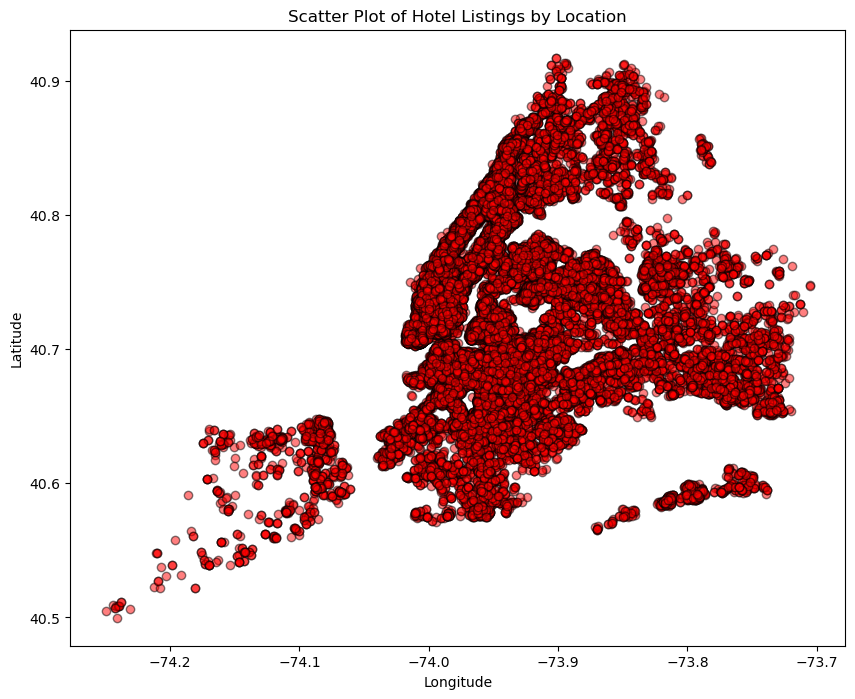

In [17]:
# Creating the scatter plot showing the locations of the hotel listings in the dataset

#import the clean data file:
df= pd.read_csv("Resources/clean_df.csv")


import matplotlib.pyplot as plt
import pandas as pd

# Create a scatter plot for the hotel locations based on latitude and longitude
plt.figure(figsize=(10, 8))
plt.scatter(df['longitude'], df['latitude'], alpha=0.5, edgecolor='k', color='red')

# Adding labels and title
plt.title('Scatter Plot of Hotel Listings by Location')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Show the plot
plt.show()

# The scatter plot demonstrates that hotel listings are primarily concentrated in the central parts of the city, likely indicating higher demand in those areas. The coverage of listings across the city, with varying densities, suggests that while central areas are preferred, there is still a notable presence of hotels in less central regions, catering to a broader range of travelers and preferences.

/var/folders/24/q7mj2hmn47n21n9t4by4cfpc0000gn/T/ipykernel_13527/369936936.py:21: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


<Figure size 1400x800 with 0 Axes>

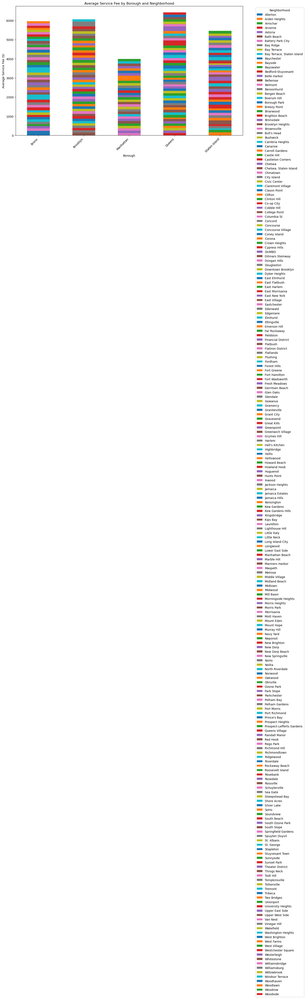

In [18]:
# The graph below shows the average service fee by borough and neighbourhood:

#import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV file
file_path = 'Resources/clean_df.csv'
df = pd.read_csv(file_path)

# Group the data by 'borough' and 'neighborhood', then calculate the mean of the 'service fee'
grouped_df = df.groupby(['borough', 'neighborhood'])['service fee'].mean().unstack()

# Plotting the bar graph
plt.figure(figsize=(14, 8))
grouped_df.plot(kind='bar', stacked=True, figsize=(14, 8))

# Customizing the plot
plt.title('Average Service Fee by Borough and Neighborhood')
plt.xlabel('Borough')
plt.ylabel('Average Service Fee ($)')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Neighborhood', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

# Display the plot
plt.show()

##The bar graph visually represents the correlation between service fees and their distribution across various boroughs and neighborhoods. By analyzing this graph, we can observe significant variations in service fees both across boroughs and within neighborhoods, highlighting the impact of local economic conditions, demand, and property characteristics.

At the borough level, there is a clear disparity in average service fees. Boroughs like Manhattan and Brooklyn exhibit a broader range of service fees, suggesting a more diverse mix of high-demand and lower-demand neighborhoods. In these boroughs, the average service fees are generally higher, likely due to the concentration of economic activity, tourism, and prime real estate locations. Conversely, boroughs such as Queens and The Bronx show more consistent and generally lower service fees, which may reflect lower property values or less intense demand compared to Manhattan and Brooklyn.

Within each borough, neighborhoods contribute differently to the overall average service fee. The graph's stacked bars illustrate that certain neighborhoods have significantly higher fees, which could be attributed to factors like proximity to business districts, historical significance, or popularity among tourists. For example, high-demand neighborhoods in Manhattan, such as Midtown, tend to have higher average service fees, while less central neighborhoods might show lower fees. This variation within boroughs indicates that local factors at the neighborhood level, such as amenities, transportation links, or overall desirability, play a crucial role in determining service fees.

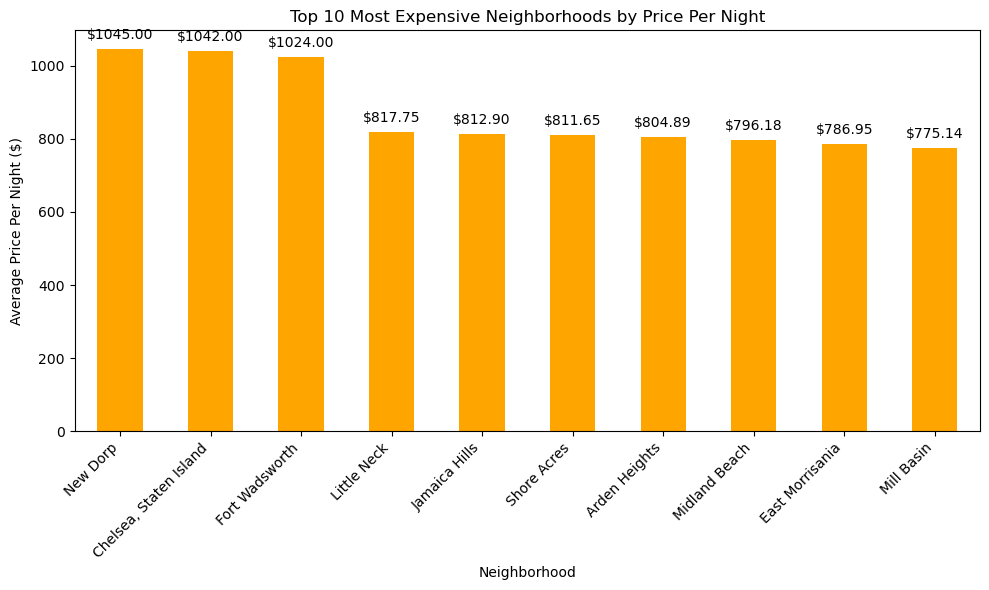

In [19]:
# The graph shows the Top 10 neighbourhood by price per night:

import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV file
file_path = 'Resources/clean_df.csv'
data = pd.read_csv(file_path)

# Group the data by neighborhood and calculate the mean price per night
top_neighborhoods = data.groupby('neighborhood')['price per night'].mean().sort_values(ascending=False).head(10)

# Plotting the bar graph with values displayed on each bar
plt.figure(figsize=(10, 6))
bars = top_neighborhoods.plot(kind='bar', color='orange')

# Adding values on top of each bar
for bar in bars.patches:
    bars.annotate(f'${bar.get_height():.2f}', 
                  xy=(bar.get_x() + bar.get_width() / 2, bar.get_height()), 
                  xytext=(0, 5),  # Offset the text slightly above the bar
                  textcoords='offset points', 
                  ha='center', va='bottom')

plt.title('Top 10 Most Expensive Neighborhoods by Price Per Night')
plt.xlabel('Neighborhood')
plt.ylabel('Average Price Per Night ($)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()


# Show the plot
plt.show()

#By identifying these top 10 neighborhoods, we gain insights into market trends and pricing dynamics. For travelers or potential renters, this information is valuable as it helps them understand where they might expect to pay a premium for accommodation. For property owners and investors, the data provides a clear picture of which areas might yield higher returns on rental investments due to their higher average nightly rates.

The visual representation of the graph shows that the most expesnive neighbourhood is New dorp per night while the least expensive one is Mill Basin. 

In summary, the graph serves as a useful tool for both consumers and investors by illustrating the economic landscape of the neighborhoods. It underscores the differences in accommodation costs and provides a snapshot of the premium areas within the dataset, which can guide decision-making in both travel and property investment.

In [25]:
# Nick section (next 20 cells)
# Do some geoplotting! First plot every listing on a map
clean_df.head()

,id,borough,neighborhood,latitude,longitude,service fee,price per night,room type,cancellation policy,minimum nights,construction year,number of reviews,review rate number,calculated host listings count,days available per year
0,1001254,Brooklyn,Kensington,40.64749,-73.97237,193.0,966.0,Private room,strict,10,2020,9,4,6,286
1,1002102,Manhattan,Midtown,40.75362,-73.98377,28.0,142.0,Entire home/apt,moderate,30,2007,45,4,2,228
2,1002403,Manhattan,Harlem,40.80902,-73.94190,124.0,620.0,Private room,flexible,3,2005,0,5,1,352
3,1002755,Brooklyn,Clinton Hill,40.68514,-73.95976,74.0,368.0,Entire home/apt,moderate,30,2005,270,4,1,322
4,1003689,Manhattan,East Harlem,40.79851,-73.94399,41.0,204.0,Entire home/apt,moderate,10,2009,9,3,1,289


In [32]:
# A plot of all the listing in the DataFrame
listing_plot1 = clean_df.hvplot.points(
    'longitude',
    'latitude',
    geo = True,
    tiles = 'OSM',
    frame_width = 800,
    frame_height = 600,
    alpha = .5,
    color= 'teal',
    size= 10
)

listing_plot1

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [longitude,latitude]

In [ ]:
# A plot with all the listing separated by borough
listing_plot2 = clean_df.hvplot.points(
    'longitude',
    'latitude',
    geo = True,
    tiles = 'OSM',
    frame_width = 800,
    frame_height = 600,
    alpha = .5,
    color= 'borough',
    size= 10
)

listing_plot2

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [longitude,latitude]   (borough)

In [ ]:
# A plot with all the listing separated by neighborhood
listing_plot3 = clean_df.hvplot.points(
    'longitude',
    'latitude',
    geo = True,
    tiles = 'OSM',
    frame_width = 800,
    frame_height = 600,
    alpha = .5,
    color= 'neighborhood',
    size= 10,
    
)

listing_plot3

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [longitude,latitude]   (neighborhood)